# Feature plotting

## Initialize

In [127]:
import librosa
import matplotlib.pyplot as plt
from matplotlib.axes import Axes
import numpy as np
from IPython.display import Audio, display
figsize: tuple[float, float] = (12, 8)
import os

In [166]:
filepath = "/Users/yoonsookim/Library/CloudStorage/GoogleDrive-ml.laptise@gmail.com/マイドライブ/audio/batch/More-KDA/mr.wav"
cwd = os.getcwd()
dest_dir = os.path.join(cwd, "outpus")
y, sr= librosa.load(filepath, mono=True, duration=120.0, offset=0)
display(Audio(y, rate=sr))

## Spectral

### Melspecto

/Users/yoonsookim/dawai/venv/lib/python3.10/site-packages/librosa/feature/spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

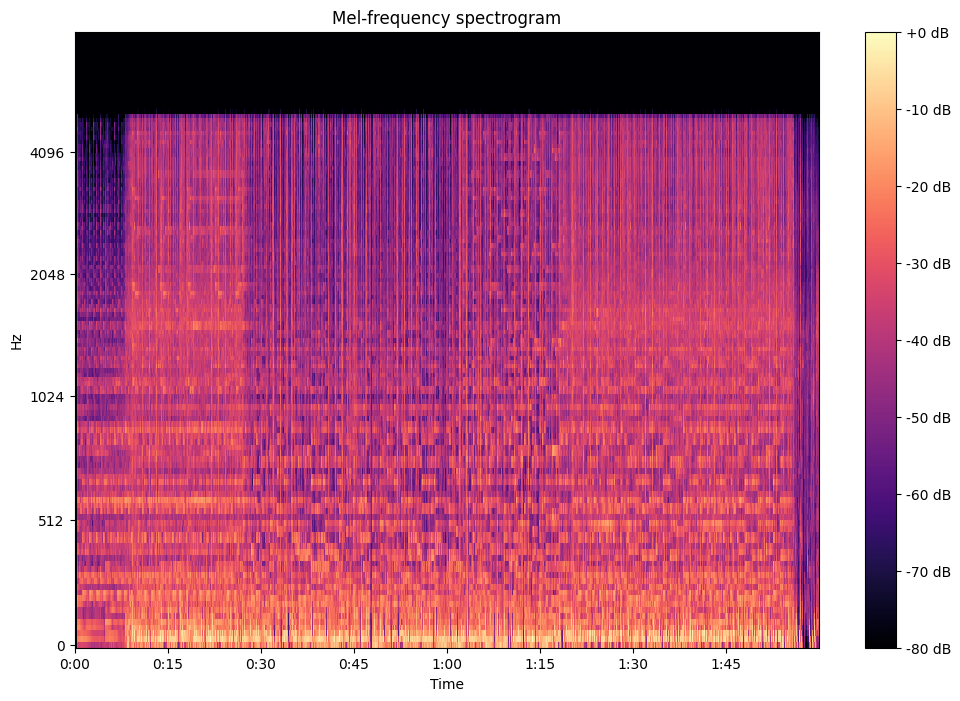

In [131]:
# Extract
librosa.feature.melspectrogram(y=y, sr=sr)
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128,
                                    fmax=20000)

# plot
fig = plt.figure(figsize=figsize)
ax:Axes = fig.subplots(1,1) # type: ignore

S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')


### Chroma

#### Chroma STFT

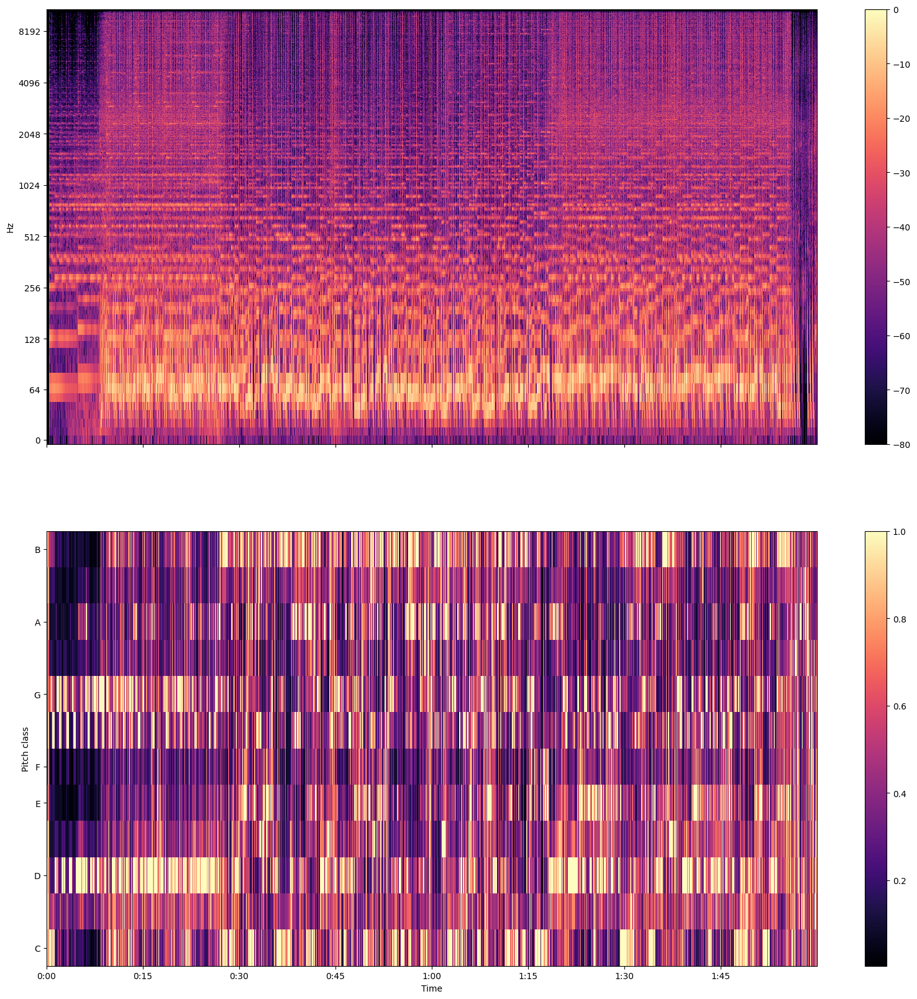

In [130]:
# extract
chroma = librosa.feature.chroma_stft(y=y, sr=sr)
S = np.abs(librosa.stft(y))

# plot
fig = plt.figure(figsize=(20,20))
ax: list[Axes] = fig.subplots(nrows=2, sharex=True) # type: ignore
img = librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                               y_axis='log', x_axis='time', ax=ax[0])
fig.colorbar(img, ax=[ax[0]])
ax[0].label_outer()
img = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', ax=ax[1])
fig.colorbar(img, ax=[ax[1]])

## Tonnetz

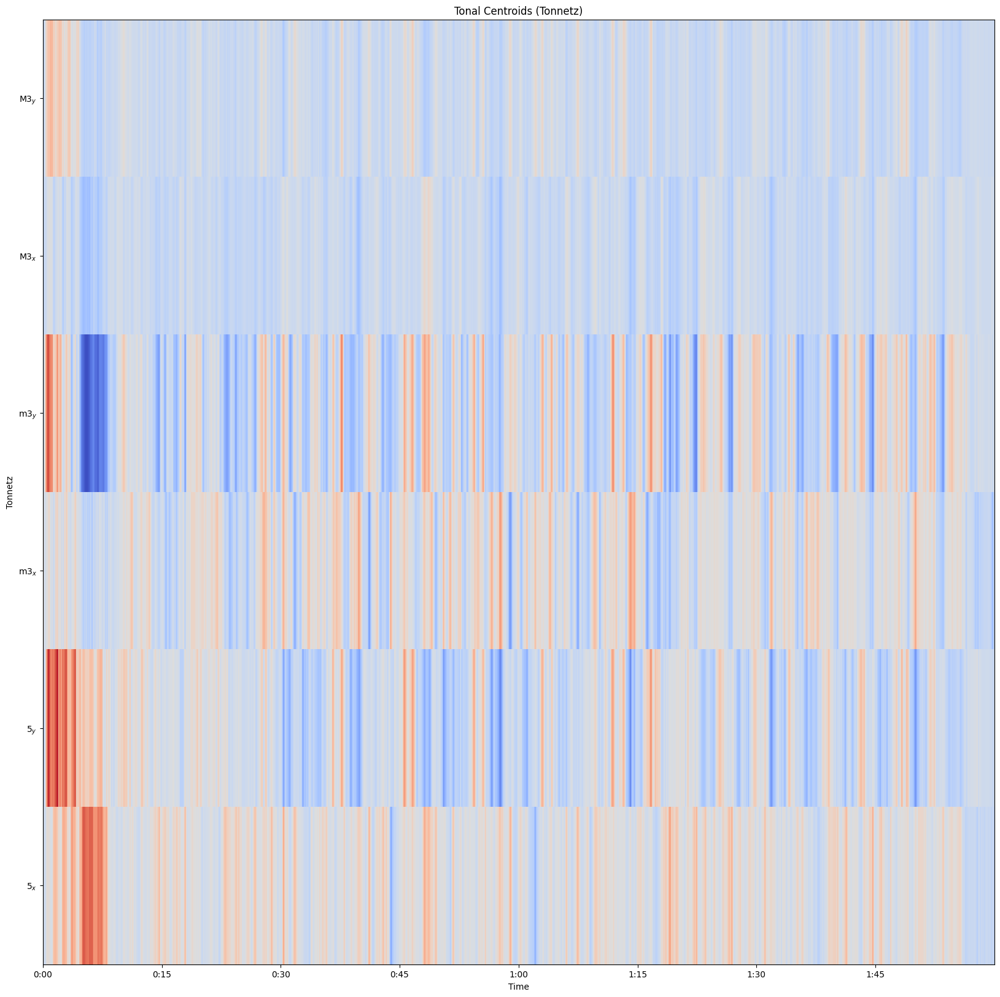

In [119]:
# Extraction
h = librosa.effects.harmonic(y)
tonnetz = librosa.feature.tonnetz(y=h, sr=sr)

fig = plt.figure(figsize=(20, 20))
ax :Axes = fig.subplots(1,1) # type: ignore
img1 = librosa.display.specshow(tonnetz,
                                y_axis='tonnetz', x_axis='time', ax=ax)
ax.set(title='Tonal Centroids (Tonnetz)')
ax.label_outer()

## Contrast

[Text(0, 0.5, 'Frequency bands'), Text(0.5, 1.0, 'Spectral contrast')]

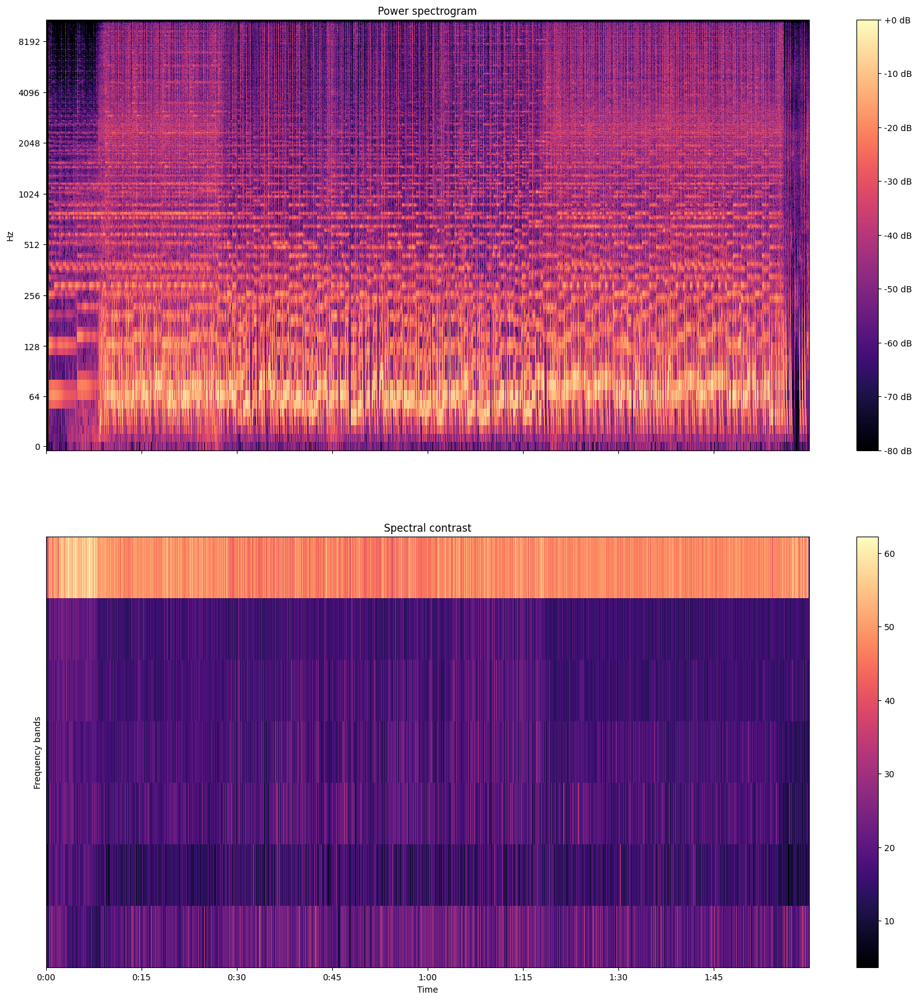

In [126]:
S = np.abs(librosa.stft(y))
contrast = librosa.feature.spectral_contrast(S=S, sr=sr, n_fft=128)
fig = plt.figure(figsize=(20, 20))
ax: list[Axes] = fig.subplots(nrows=2, sharex=True) # type: ignore
img1 = librosa.display.specshow(librosa.amplitude_to_db(S,
                                                 ref=np.max),
                         y_axis='log', x_axis='time', ax=ax[0])
fig.colorbar(img1, ax=[ax[0]], format='%+2.0f dB')
ax[0].set(title='Power spectrogram')
ax[0].label_outer()
img2 = librosa.display.specshow(contrast, x_axis='time', ax=ax[1])
fig.colorbar(img2, ax=[ax[1]])
ax[1].set(ylabel='Frequency bands', title='Spectral contrast')

## Rhythmetics

### Fourier Tempogram 

[Text(0.5, 1.0, 'Autocorrelation tempogram')]

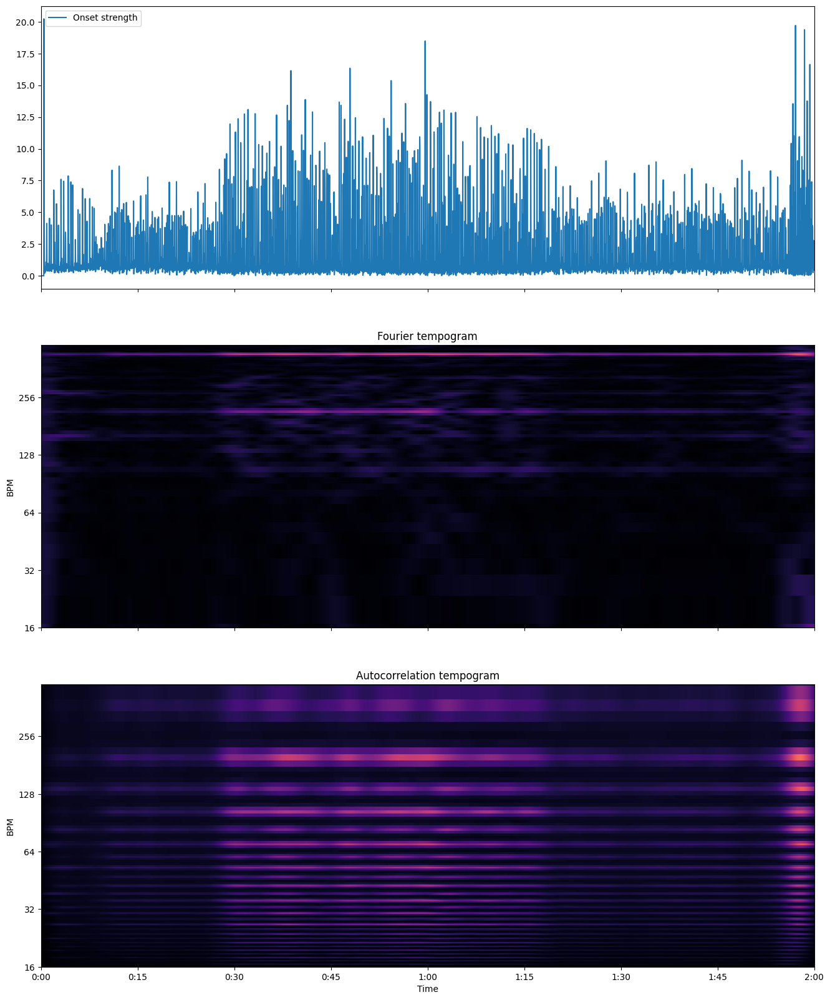

In [110]:
hop_length = 512
oenv = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
tempogram = librosa.feature.fourier_tempogram(onset_envelope=oenv, sr=sr,
                                              hop_length=hop_length)
# Compute the auto-correlation tempogram, unnormalized to make comparison easier
ac_tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr,
                                         hop_length=hop_length, norm=None)


f4 = plt.figure(figsize=(16,20))
f4x : list[Axes] = f4.subplots(nrows=3, sharex=True) # type: ignore
f4x[0].plot(librosa.times_like(oenv), oenv, label='Onset strength')
f4x[0].legend(frameon=True)
f4x[0].label_outer()

# f4x1 = f4.add_subplot()


librosa.display.specshow(np.abs(tempogram), sr=sr, hop_length=hop_length,
                         x_axis='time', y_axis='fourier_tempo', cmap='magma',
                         ax=f4x[1])
f4x[1].set(title='Fourier tempogram')
f4x[1].label_outer()

librosa.display.specshow(ac_tempogram, sr=sr, hop_length=hop_length,
                         x_axis='time', y_axis='tempo', cmap='magma',
                         ax=f4x[2])
f4x[2].set(title='Autocorrelation tempogram')

## Tempogram

(5626,)


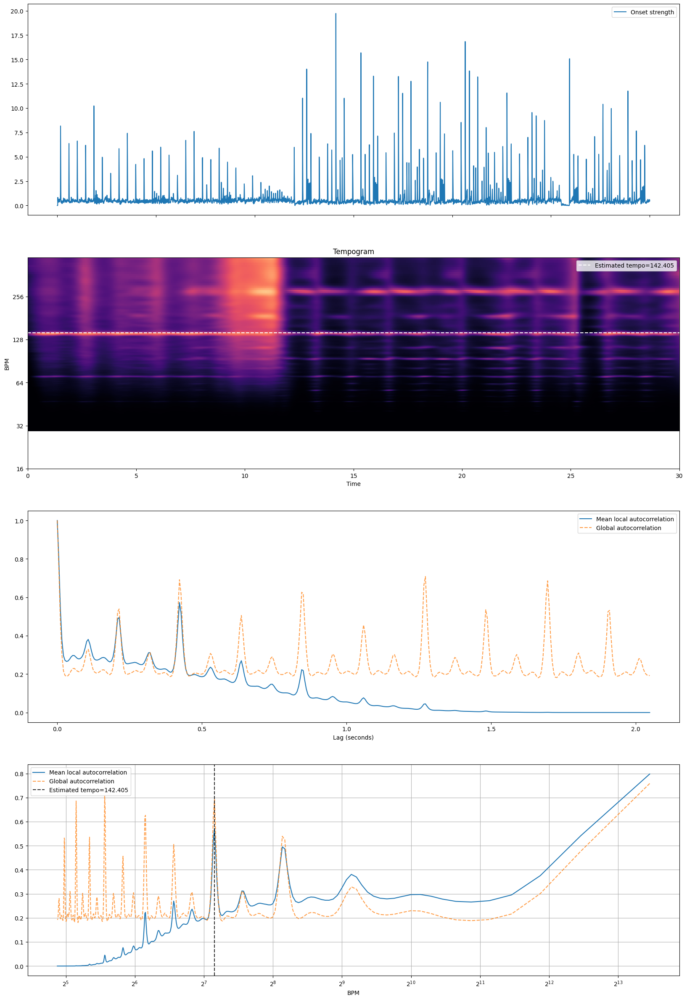

In [167]:
# extract
hop_length = 256
y, sr= librosa.load(filepath, mono=True, duration=30, offset=5, sr=48000)
oenv = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr,
                                      hop_length=hop_length)
# Compute global onset autocorrelation
ac_global = librosa.autocorrelate(oenv, max_size=tempogram.shape[0])
ac_global = librosa.util.normalize(ac_global)
# Estimate the global tempo for display purposes
tempos = librosa.feature.tempo(onset_envelope=oenv, sr=sr,
                              hop_length=hop_length)
print(oenv.shape)
tempo = tempos.mean()

# Plot
fig = plt.figure(figsize=(20, 30))
ax: list[Axes] = fig.subplots(4) # type: ignore
times = librosa.times_like(oenv, sr=sr, hop_length=hop_length)
ax[0].plot(times, oenv, label='Onset strength')
ax[0].label_outer()
ax[0].legend(frameon=True)
librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length,
                         x_axis='time', y_axis='tempo', cmap='magma',
                         ax=ax[1])
ax[1].axhline(tempo, color='w', linestyle='--', alpha=1,
            label='Estimated tempo={:g}'.format(tempo))
ax[1].legend(loc='upper right')
ax[1].set(title='Tempogram')
x = np.linspace(0, tempogram.shape[0] * float(hop_length) / sr,
                num=tempogram.shape[0])
ax[2].plot(x, np.mean(tempogram, axis=1), label='Mean local autocorrelation')
ax[2].plot(x, ac_global, '--', alpha=0.75, label='Global autocorrelation')
ax[2].set(xlabel='Lag (seconds)')
ax[2].legend(frameon=True)
freqs = librosa.tempo_frequencies(tempogram.shape[0], hop_length=hop_length, sr=sr)
ax[3].semilogx(freqs[1:], np.mean(tempogram[1:], axis=1),
             label='Mean local autocorrelation', base=2)
ax[3].semilogx(freqs[1:], ac_global[1:], '--', alpha=0.75,
             label='Global autocorrelation', base=2)
ax[3].axvline(tempo, color='black', linestyle='--', alpha=.8,
            label='Estimated tempo={:g}'.format(tempo))
ax[3].legend(frameon=True)
ax[3].set(xlabel='BPM')
ax[3].grid(True)